# ConvexGating plots on large PBMC panel

We use the `convexgating` tool to compute gates for a simple flow data set with a large general panel. Here, we plot the resulting F1, precision and recall scores per cell type.

In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
import scanpy as sc

In [16]:
import convexgating as cg 
from convex_hull_add_on import add_tight_analysis

In [54]:
from contour_scatter import contour_lines_separate_outliers, generate_lut_func, prepare_contour_plot

Show versions.

In [5]:
print('pandas ' + pd.__version__)
print('numpy ' + np.__version__)
print('seaborn ' + sns.__version__)

pandas 1.3.4
numpy 1.20.0
seaborn 0.11.2


Custom color for performance plots throughout the paper.

In [3]:
colors = {
"f1": "#663171",
"recall": "#e2998a",
"precision": "#0c7156",
}

## Performance plots of ConvexGating

### Cell type level 1

Set paths to files.

In [4]:
project_dir = '../data/performance_test/convex_gating/HIV_data/cell_type_lvl_1'

In [8]:
dirs = os.listdir(project_dir)

In [10]:
dict_performance = dict()
for directory in dirs:
    subdir = os.listdir(os.path.join(project_dir, directory))
    subdir_name = [idx for idx in subdir if idx.startswith('cluster_')]
    if len(subdir_name)==0:
        continue
    key = subdir_name[0].split('cluster_')[1]
    sample = directory.split('_')[-1]
    if key =='not annotated':
        continue
    tmp = pd.read_csv(f'{project_dir}/{directory}/{subdir_name[0]}/performance.csv', index_col=0)
    tmp['score'] = tmp.index.values
    tmp['cell_type'] = key
    tmp['sample'] = sample
    dict_performance[directory] = tmp

In [11]:
tmp

,hierarchy_1,hierarchy_2,hierarchy_3,hierarchy_4,score,cell_type,sample
f1,0.994142,0.981229,0.943358,0.942469,f1,T cell,NL09
recall,0.988987,0.963233,0.892827,0.891198,recall,T cell,NL09
precision,0.999350,0.999911,0.999952,1.000000,precision,T cell,NL09


In [13]:
scores = pd.concat(dict_performance, ignore_index=True)

In [14]:
scores = scores[scores['cell_type']!='monocyte']

In [15]:
scores

,hierarchy_1,hierarchy_2,hierarchy_3,score,cell_type,sample,hierarchy_4,hierarchy_5
0,0.930495,0.930643,0.927261,f1,B cell,NL01,NaN,NaN
1,0.876179,0.870283,0.864387,recall,B cell,NL01,NaN,NaN
2,0.991989,1.000000,1.000000,precision,B cell,NL01,NaN,NaN
3,0.945482,0.948267,0.947740,f1,B cell,NL03,0.946411,NaN
4,0.911228,0.905950,0.900672,recall,B cell,NL03,0.898273,NaN
...,...,...,...,...,...,...,...,...
70,0.994028,0.981943,0.936784,recall,T cell,NL07,0.933922,0.933781
71,0.999041,0.999640,0.999887,precision,T cell,NL07,0.999924,0.999962
72,0.994142,0.981229,0.943358,f1,T cell,NL09,0.942469,NaN
73,0.988987,0.963233,0.892827,recall,T cell,NL09,0.891198,NaN


Check NAs and fill in from previous hierarchies.

In [16]:
cols = ['hierarchy_2', 'hierarchy_3', 'hierarchy_4', 'hierarchy_5']
for idx, column in enumerate(cols):
    na_row =scores[column].isna()
    scores[column][na_row] = scores[cols[idx-1]][na_row] 

/tmp/ipykernel_2038895/4041294965.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[column][na_row] = scores[cols[idx-1]][na_row]


Save to file.

In [17]:
scores.to_csv(os.path.join(project_dir, "performance_summary_HIV_level1.csv"))

Plot performance in hierarchy 5.

/opt/python/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 64.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/tmp/ipykernel_3645461/3803256829.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=18)


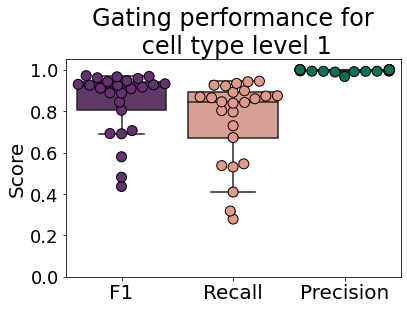

In [41]:
fig, ax = plt.subplots()

sns.boxplot(data = scores, y='hierarchy_5', x='score', palette=colors)
sns.swarmplot(data = scores, y='hierarchy_5', x='score',edgecolor='k', linewidth=1, size=10, palette=colors)
plt.ylabel('Score', fontsize=20)
plt.ylim([0,1.05])
plt.xlabel('')

labels = [round(item,1) for item in ax.get_yticks()]

ax.set_yticklabels(labels, fontsize=18)
ax.set_xticklabels(['F1', 'Recall', 'Precision'], fontsize=20)

#plt.xticks()

plt.title('Gating performance for\n cell type level 1', fontsize=24)
plt.savefig('../figures/performance_cell_types_lvl1_Bonaguro.png', bbox_inches='tight')
plt.savefig('../figures/performance_cell_types_lvl1_Bonaguro.pdf', bbox_inches='tight')
plt.show()

### Cell type level 2

Set paths to files.

In [18]:
project_dir = '../data/performance_test/convex_gating/HIV_data/cell_type_lvl_2'

In [19]:
dirs = os.listdir(project_dir)

In [20]:
dict_performance = dict()
for directory in dirs:
    subdir = os.listdir(os.path.join(project_dir, directory))
    subdir_name = [idx for idx in subdir if idx.startswith('cluster_')]
    if len(subdir_name)==0:
        continue
    key = subdir_name[0].split('cluster_')[1]
    sample = directory.split('_')[-1]
    if key =='not annotated':
        continue
    tmp = pd.read_csv(f'{project_dir}/{directory}/{subdir_name[0]}/performance.csv', index_col=0)
    tmp['score'] = tmp.index.values
    tmp['cell_type'] = key
    tmp['sample'] = sample
    dict_performance[directory] = tmp

In [23]:
scores = pd.concat(dict_performance, ignore_index=True)

In [24]:
scores = scores[scores['cell_type']!='monocyte']

In [25]:
scores

,hierarchy_1,hierarchy_2,hierarchy_3,score,cell_type,sample,hierarchy_4,hierarchy_5
0,0.930495,0.930643,0.927261,f1,B cell,NL01,NaN,NaN
1,0.876179,0.870283,0.864387,recall,B cell,NL01,NaN,NaN
2,0.991989,1.000000,1.000000,precision,B cell,NL01,NaN,NaN
3,0.945482,0.948267,0.947740,f1,B cell,NL03,0.946411,NaN
4,0.911228,0.905950,0.900672,recall,B cell,NL03,0.898273,NaN
...,...,...,...,...,...,...,...,...
175,0.996667,0.996667,0.993333,recall,pre-DC,NL07,0.990000,0.983333
176,0.993355,0.996667,0.996656,precision,pre-DC,NL07,0.996644,0.996622
177,0.995708,0.991379,NaN,f1,pre-DC,NL09,NaN,NaN
178,0.991453,0.982906,NaN,recall,pre-DC,NL09,NaN,NaN


Check NAs and fill in from previous hierarchies.

In [26]:
cols = ['hierarchy_2', 'hierarchy_3', 'hierarchy_4', 'hierarchy_5']
for idx, column in enumerate(cols):
    na_row =scores[column].isna()
    scores[column][na_row] = scores[cols[idx-1]][na_row] 

/tmp/ipykernel_2038895/4041294965.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[column][na_row] = scores[cols[idx-1]][na_row]


Save to file.

In [27]:
scores.to_csv(os.path.join(project_dir, "performance_summary_HIV_level2.csv"))

Plot performance in hierarchy 5.

/opt/python/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 18.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/python/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 13.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/python/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 73.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/tmp/ipykernel_3645461/4070752143.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=18)


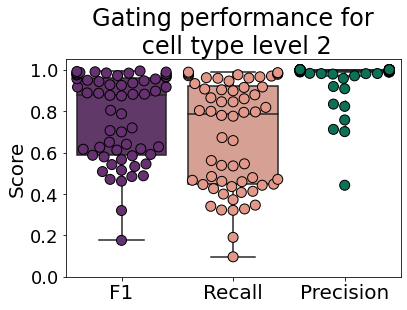

In [52]:
fig, ax = plt.subplots()

sns.boxplot(data = scores, y='hierarchy_5', x='score', palette=colors)
sns.swarmplot(data = scores, y='hierarchy_5', x='score',edgecolor='k', linewidth=1, size=10, palette=colors)
plt.ylabel('Score', fontsize=20)
plt.ylim([0,1.05])
plt.xlabel('')

labels = [round(item,1) for item in ax.get_yticks()]

ax.set_yticklabels(labels, fontsize=18)
ax.set_xticklabels(['F1', 'Recall', 'Precision'], fontsize=20)

#plt.xticks()

plt.title('Gating performance for\n cell type level 2', fontsize=24)
plt.savefig('../figures/performance_cell_types_lvl2_Bonaguro.png', bbox_inches='tight')
plt.savefig('../figures/performance_cell_types_lvl2_Bonaguro.pdf', bbox_inches='tight')
plt.show()

## Postprocessing - plot dual axis on CG plots

In [7]:
data_path = './../data/Convex_gating_test_MB/'

adata = sc.read(os.path.join(data_path, 'anndata', 'HIV_data_annotated_final.h5ad'))

In [8]:
files_all = os.listdir(data_path)

In [9]:
files_params = [fileID for fileID in files_all if fileID.count('_params_')>0]

In [13]:
params = pd.read_csv(data_path + files_params[1], 
                     index_col = 0)
rename_col = [idx.split('parameters.')[-1] for idx in params.columns.values]
params.columns = rename_col
#use only area params
params = params.loc[[channel.endswith('-A') for channel in params.index]]
#rename index using the adata.var['channel'] info
tmp_var = adata.var
#adata.var['channel_tmp'] = [channel.replace('/', '_') for channel in tmp_var.channel]
channel_renames = dict(zip(tmp_var['channel_tmp'].values, 
                           tmp_var['marker'].values))
params.index = params.index.map(channel_renames)

In [23]:
lut_func = {}
inverse_lut_func = {}
for marker in params.index:
    params_tmp = params.loc[marker]
    lut_func_tmp, inverse_lut_func_tmp = generate_lut_func(
                         neg=params_tmp['neg'], 
                         width_basis=params_tmp['widthBasis'], 
                         pos=params_tmp['pos'], 
                         max_value=params_tmp['maxValue'])
    lut_func[marker] = lut_func_tmp
    inverse_lut_func[marker] = inverse_lut_func_tmp

In [44]:
add_hull_path = os.path.join('./../', 'data', 'Convex_gating_test_MB','cg_lvl1')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


In [45]:
dirIDs = os.listdir(add_hull_path)

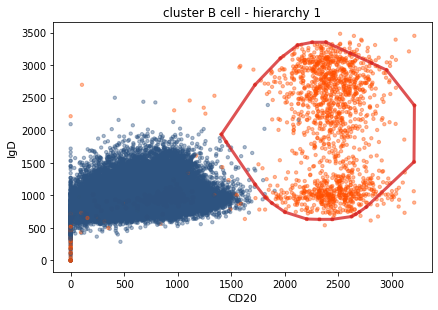

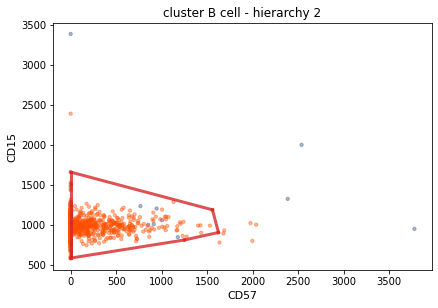

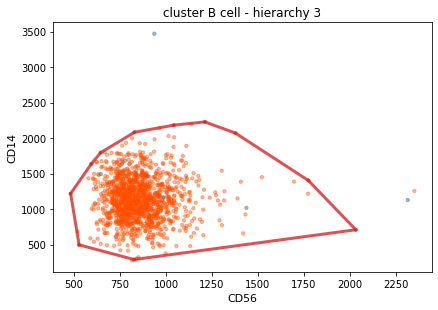

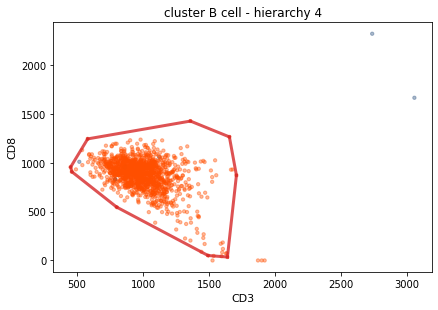

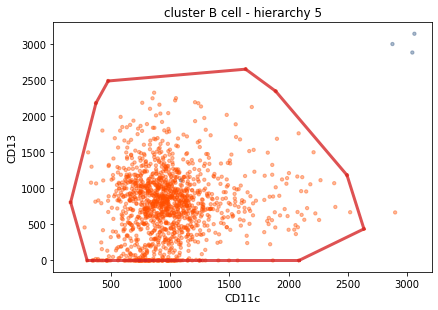

nr_targets :1672
nr_non_targets :48328
nr_targets :1358
nr_non_targets :13


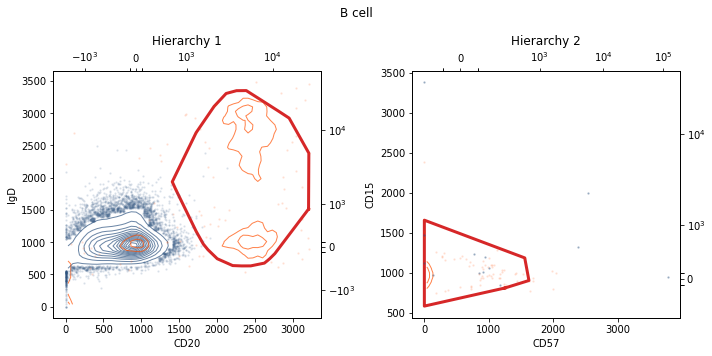

nr_targets :1672
nr_non_targets :48328
nr_targets :1358
nr_non_targets :13


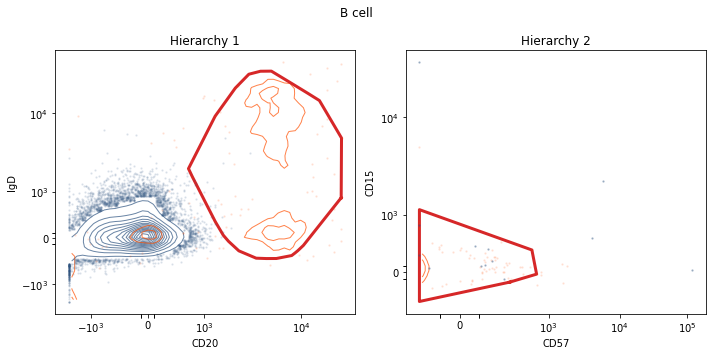

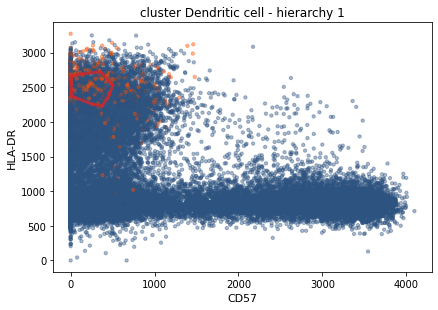

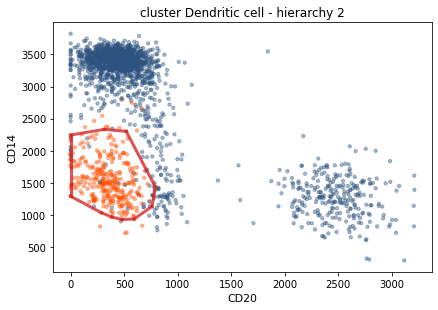

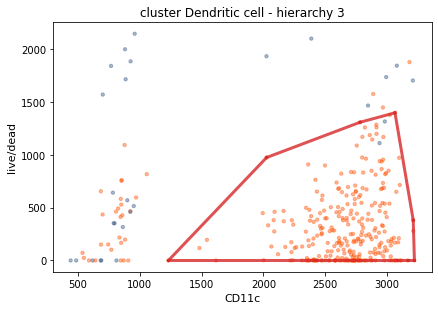

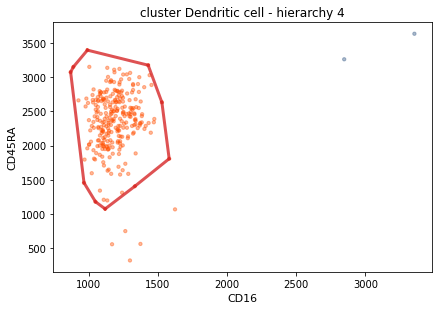

nr_targets :826
nr_non_targets :49174
nr_targets :322
nr_non_targets :1706
nr_targets :308
nr_non_targets :27


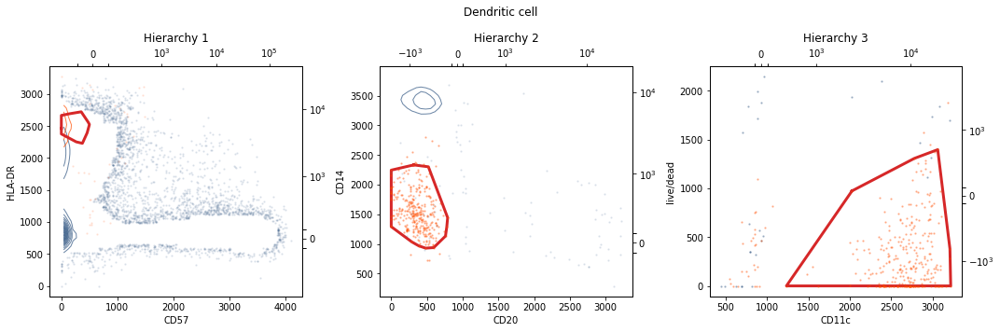

nr_targets :826
nr_non_targets :49174
nr_targets :322
nr_non_targets :1706
nr_targets :308
nr_non_targets :27


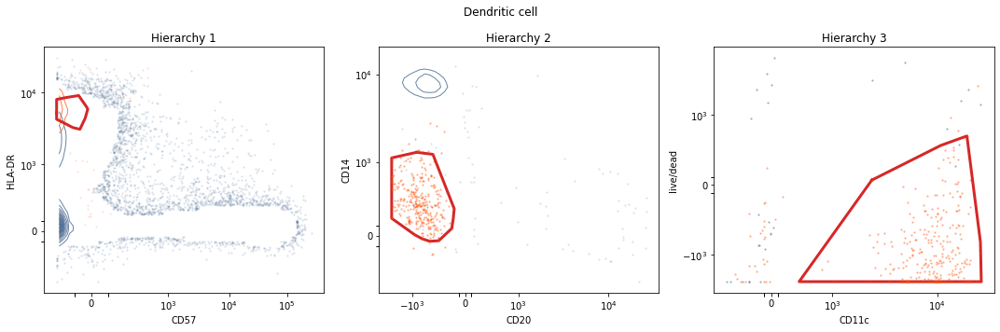

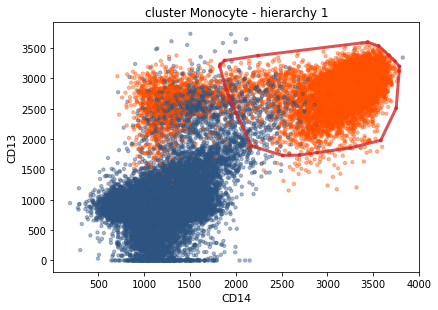

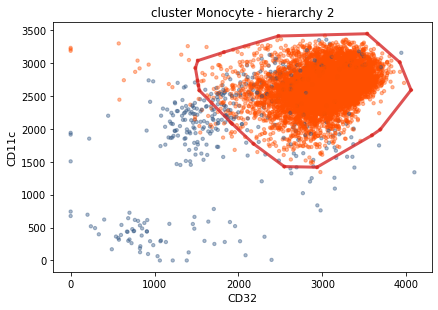

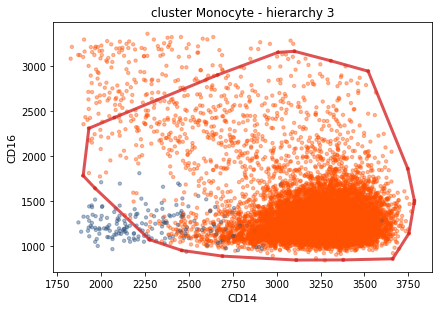

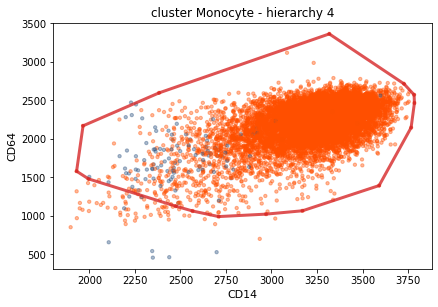

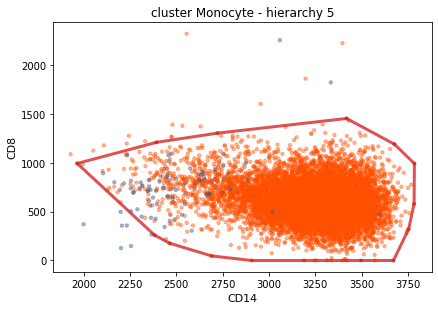

nr_targets :11763
nr_non_targets :38237
nr_targets :10544
nr_non_targets :390
nr_targets :10505
nr_non_targets :188


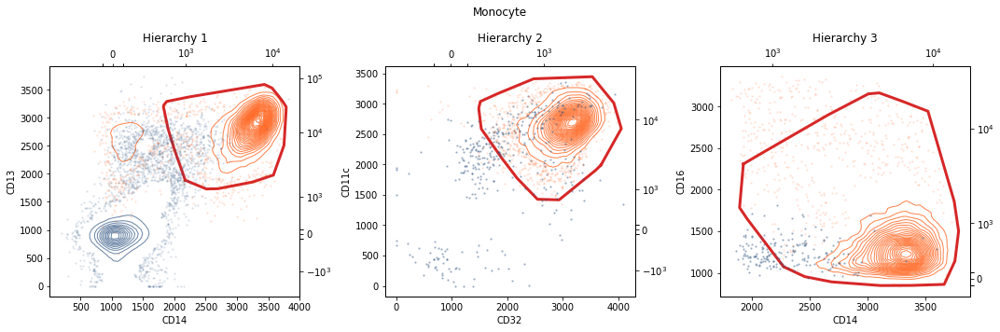

nr_targets :11763
nr_non_targets :38237
nr_targets :10544
nr_non_targets :390
nr_targets :10505
nr_non_targets :188


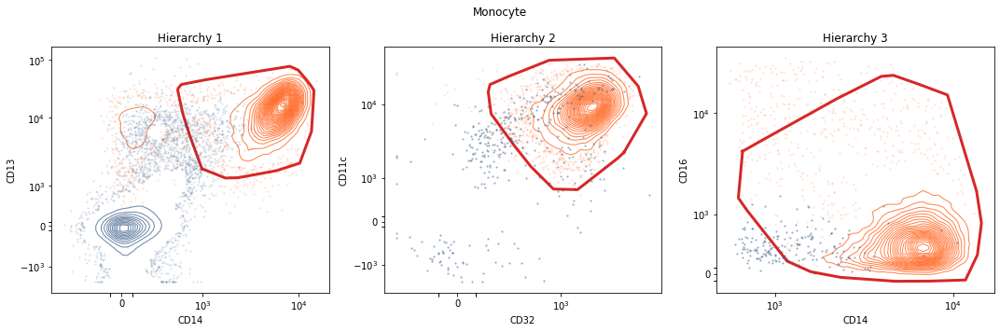

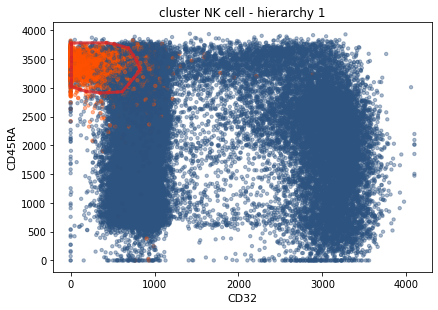

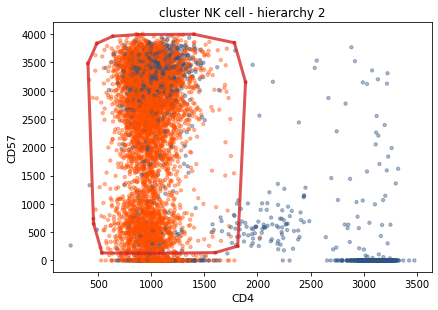

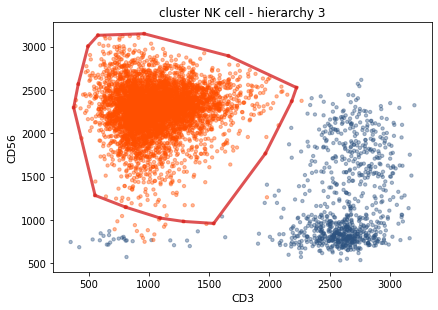

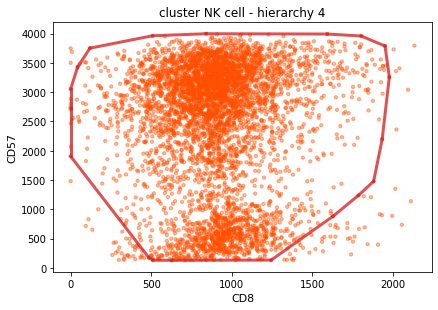

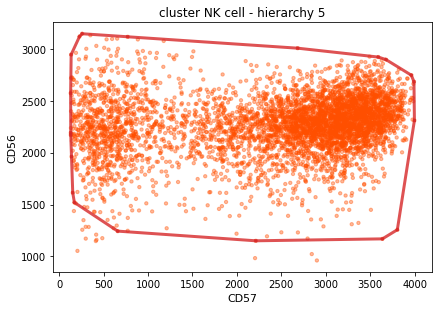

nr_targets :6467
nr_non_targets :43533
nr_targets :5474
nr_non_targets :2731
nr_targets :5046
nr_non_targets :856
nr_targets :5029
nr_non_targets :0


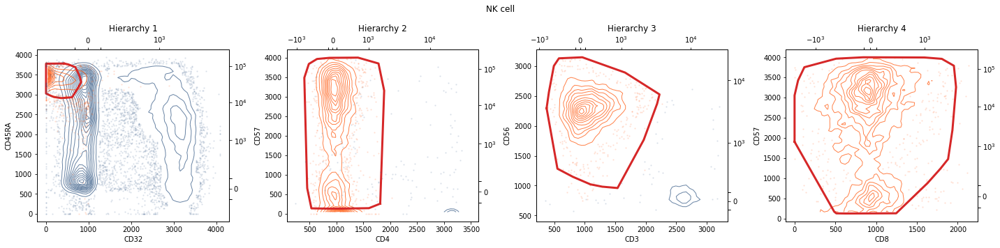

nr_targets :6467
nr_non_targets :43533
nr_targets :5474
nr_non_targets :2731
nr_targets :5046
nr_non_targets :856
nr_targets :5029
nr_non_targets :0


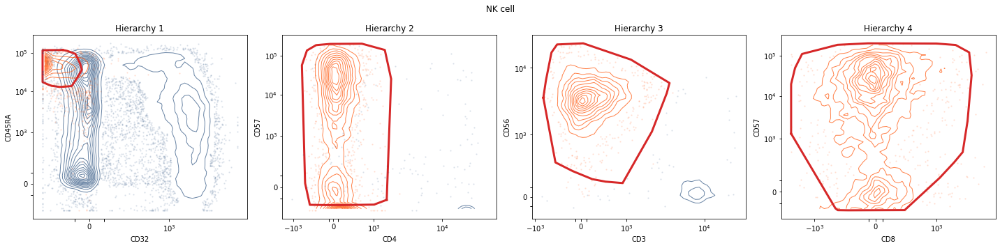

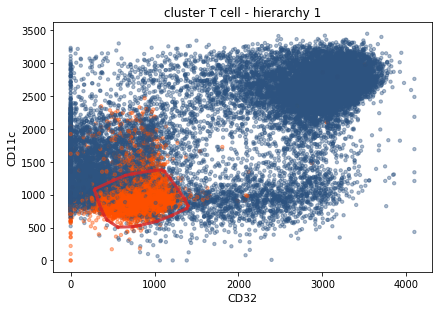

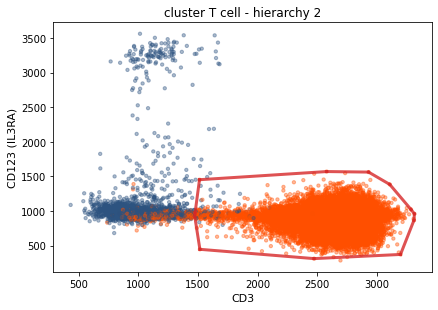

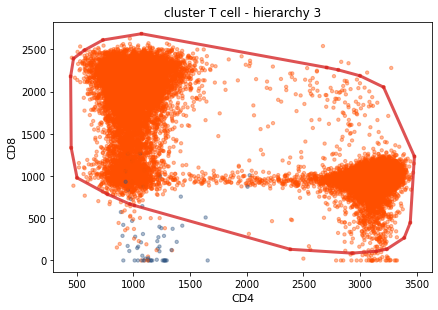

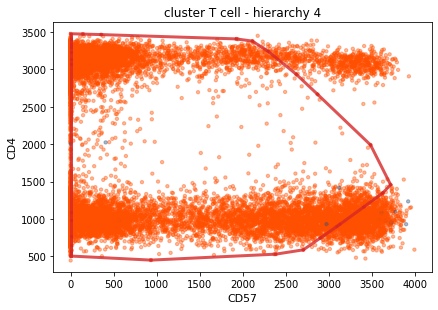

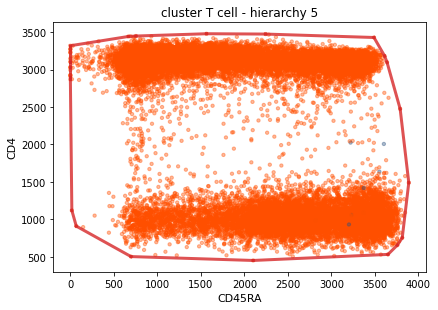

nr_targets :28284
nr_non_targets :21716
nr_targets :27565
nr_non_targets :2067
nr_targets :26998
nr_non_targets :61


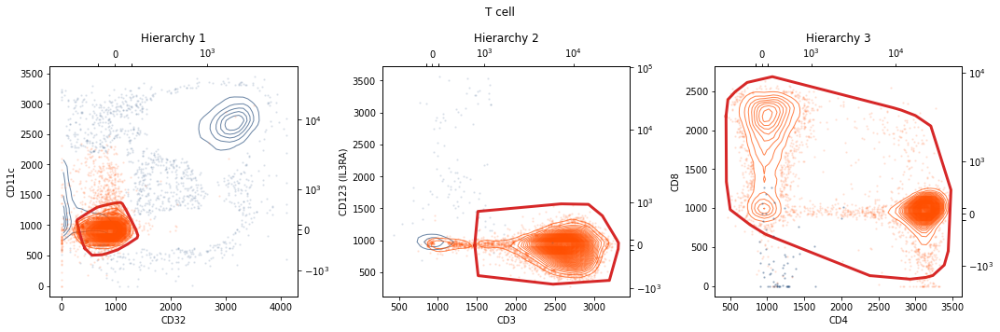

nr_targets :28284
nr_non_targets :21716
nr_targets :27565
nr_non_targets :2067
nr_targets :26998
nr_non_targets :61


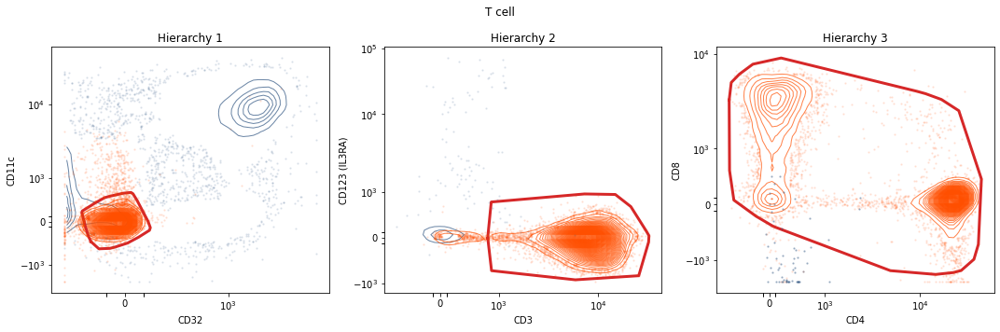

In [46]:
for cluster_key in dirIDs:
    if not cluster_key.startswith('cluster'):
        continue
    meta_info_path = os.path.join(add_hull_path, cluster_key, 'meta_info.npy')
    meta_info = np.load(meta_info_path,allow_pickle=True).item()

    population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)
    #read performance summary to obtain number of clusters
    per_summary = pd.read_csv(os.path.join(add_hull_path, cluster_key, 'performance_summary.csv'))
    num_hierarchies = np.min([per_summary['hierarchy'].max() + 1, 5])
    run_ID =0
    for mode in ['both', 'replace']:
        path = os.path.join(population_path, f'{cluster_key}')
        save = os.path.join(population_path, f'{cluster_key}',
                    population + f'_gating_strategy_{mode}.pdf')
        save_png = os.path.join(population_path, f'{cluster_key}', population + f'_gating_strategy_{mode}.png')
        if not os.path.exists(path):
            os.makedirs(path)
        contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                                        mode=mode, transform_func=lut_func, inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

In [47]:
add_hull_path = os.path.join('./../', 'data', 'Convex_gating_test_MB','cg_lvl2')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)


In [48]:
dirIDs = os.listdir(add_hull_path)

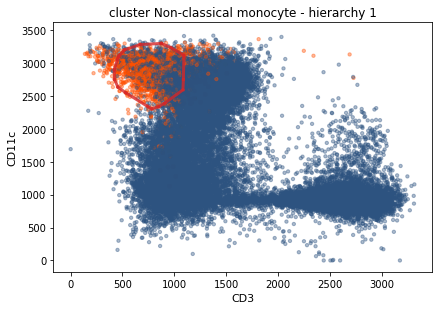

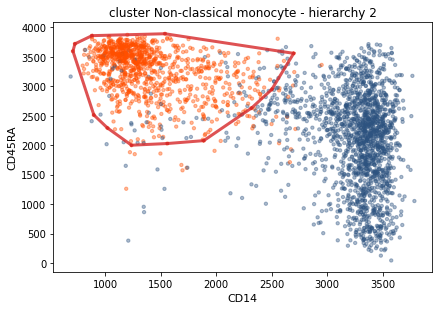

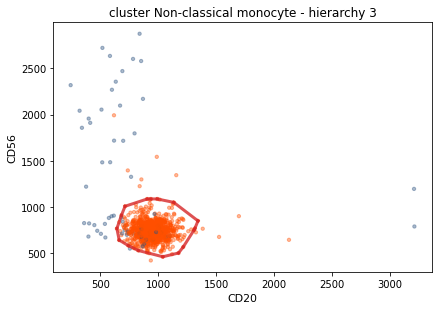

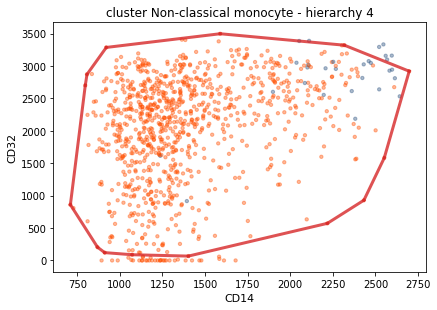

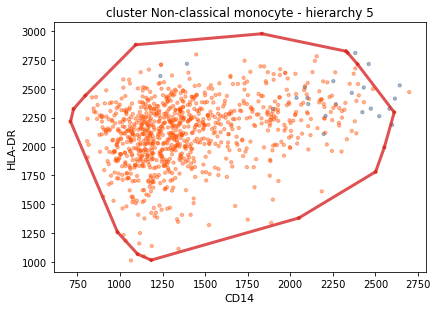

nr_targets :1388
nr_non_targets :48612
nr_targets :1013
nr_non_targets :1778
nr_targets :981
nr_non_targets :66
nr_targets :969
nr_non_targets :29


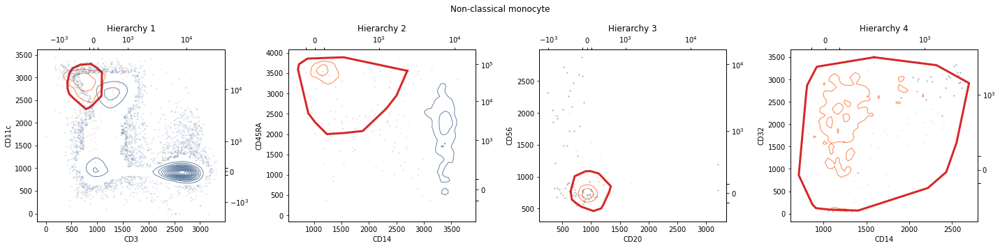

nr_targets :1388
nr_non_targets :48612
nr_targets :1013
nr_non_targets :1778
nr_targets :981
nr_non_targets :66
nr_targets :969
nr_non_targets :29


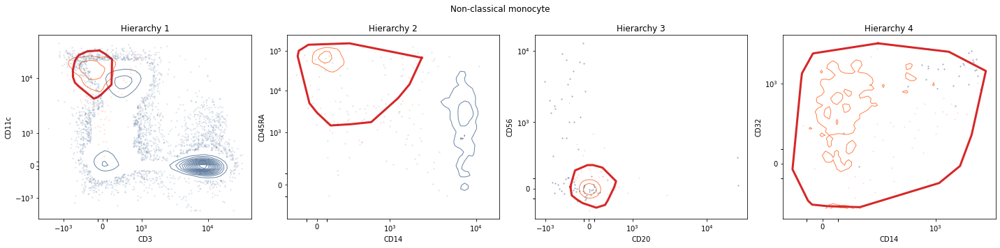

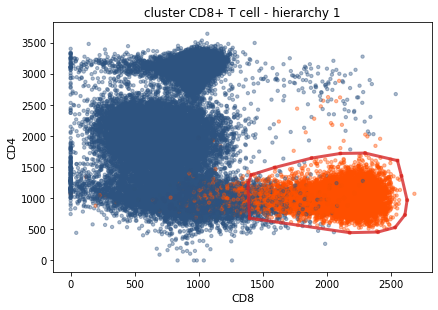

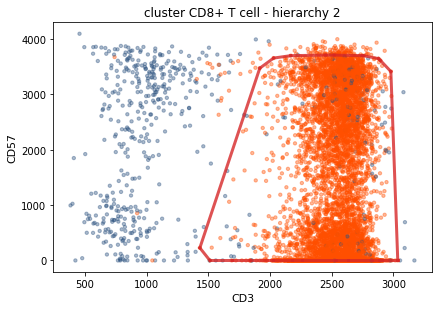

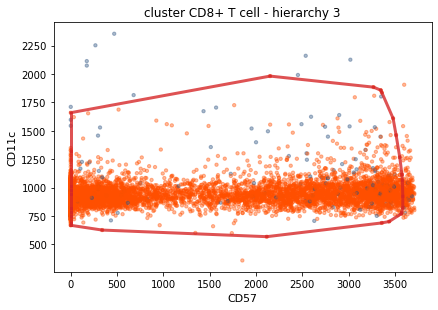

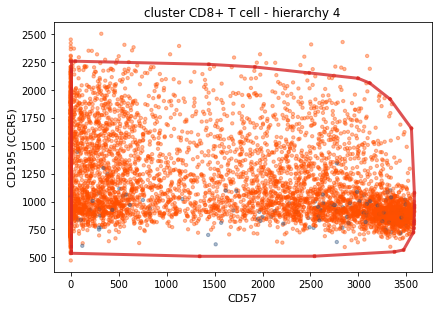

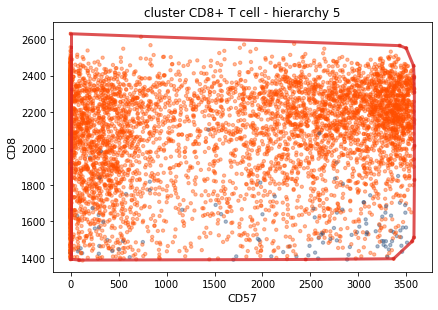

nr_targets :9143
nr_non_targets :40857
nr_targets :8258
nr_non_targets :550
nr_targets :8132
nr_non_targets :125


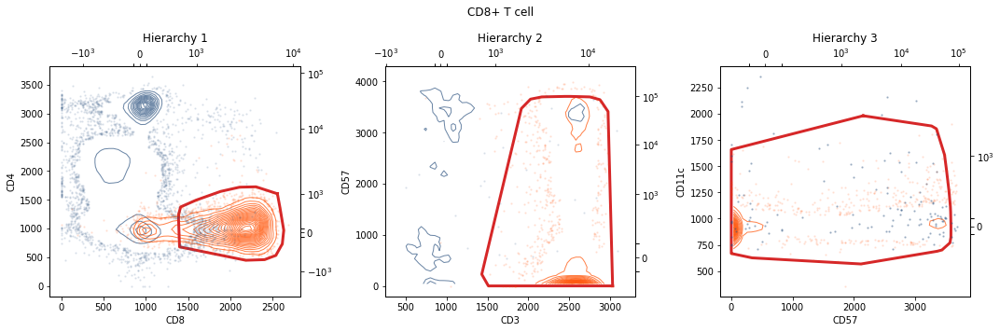

nr_targets :9143
nr_non_targets :40857
nr_targets :8258
nr_non_targets :550
nr_targets :8132
nr_non_targets :125


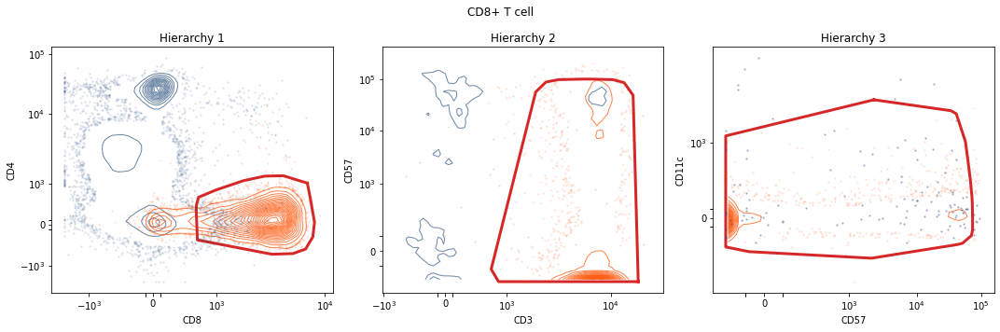

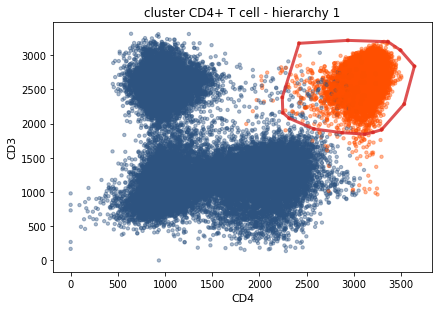

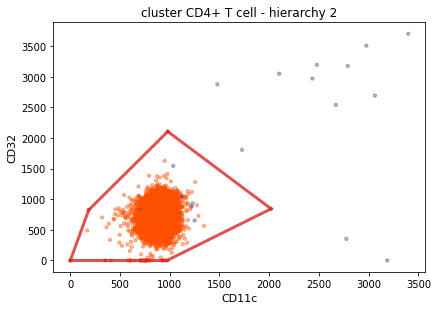

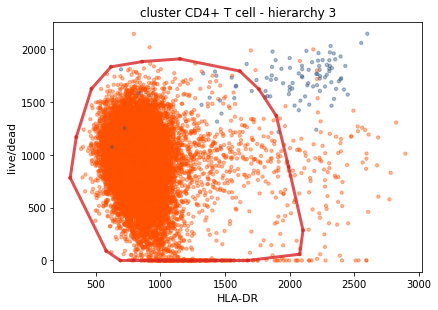

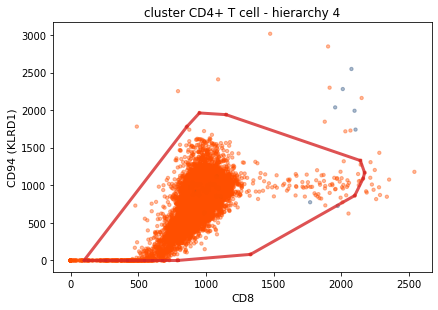

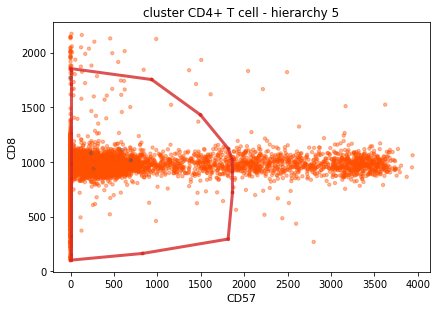

nr_targets :16615
nr_non_targets :33385
nr_targets :16537
nr_non_targets :124
nr_targets :16536
nr_non_targets :112


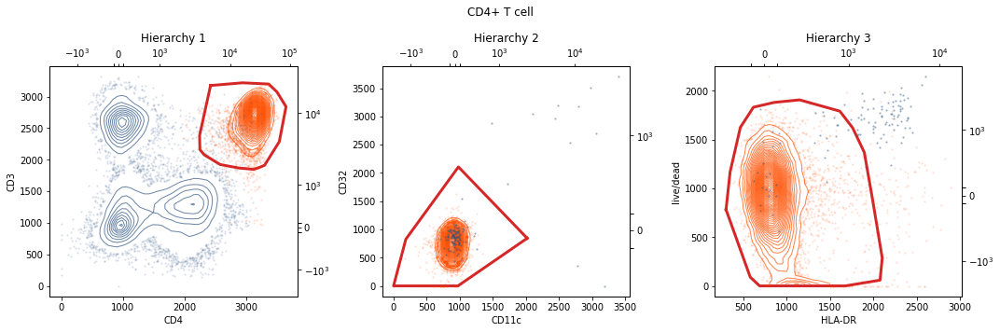

nr_targets :16615
nr_non_targets :33385
nr_targets :16537
nr_non_targets :124
nr_targets :16536
nr_non_targets :112


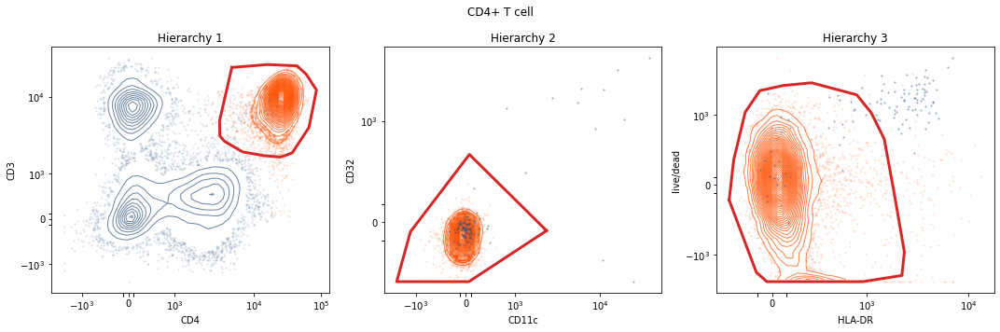

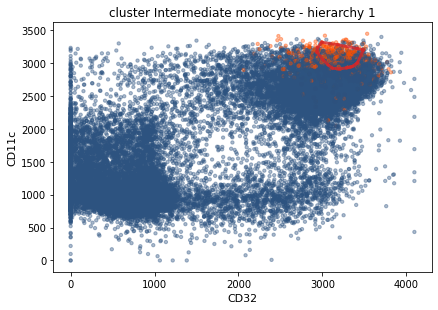

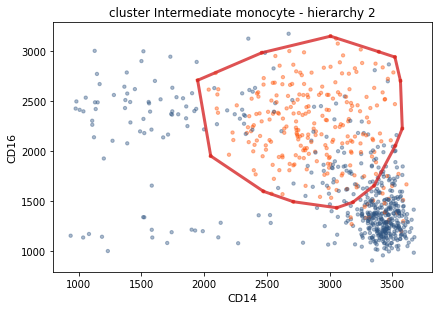

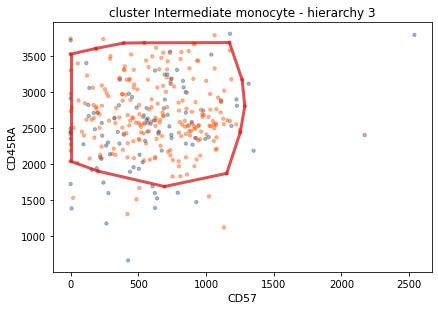

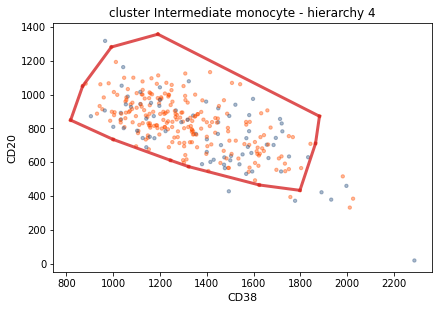

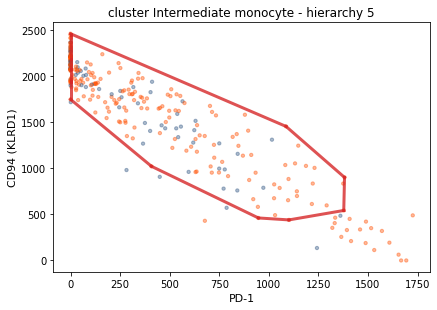

nr_targets :576
nr_non_targets :49424
nr_targets :262
nr_non_targets :502
nr_targets :240
nr_non_targets :95


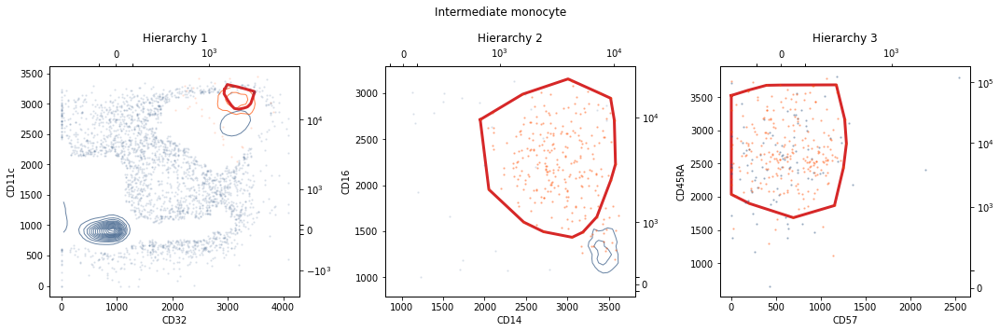

nr_targets :576
nr_non_targets :49424
nr_targets :262
nr_non_targets :502
nr_targets :240
nr_non_targets :95


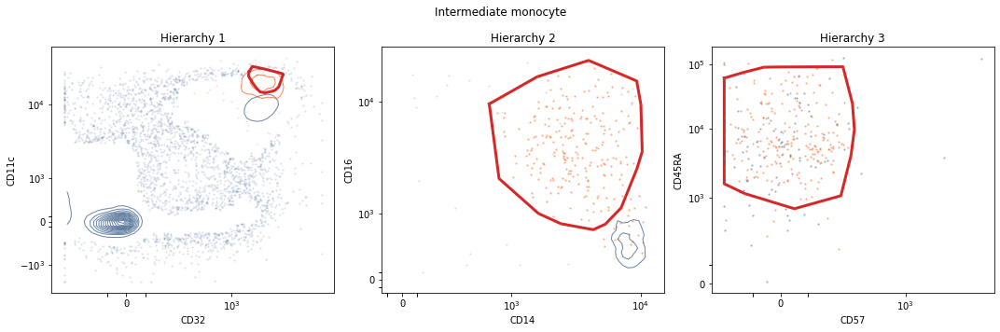

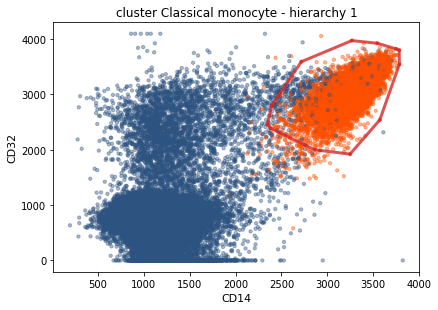

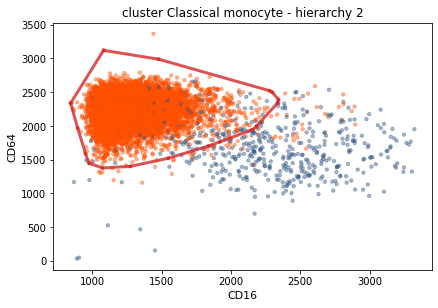

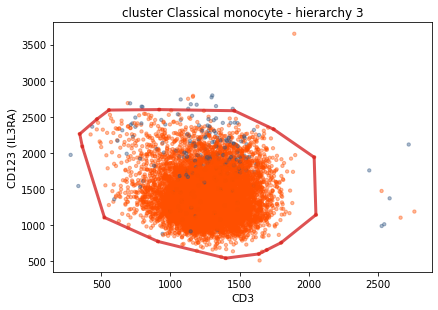

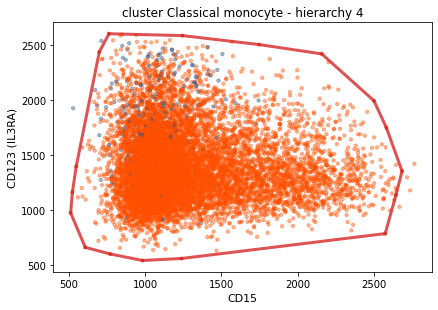

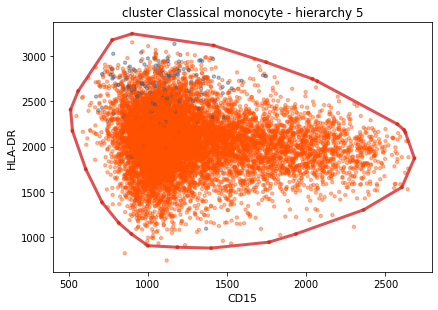

nr_targets :9799
nr_non_targets :40201
nr_targets :9664
nr_non_targets :566
nr_targets :9602
nr_non_targets :200
nr_targets :9593
nr_non_targets :182


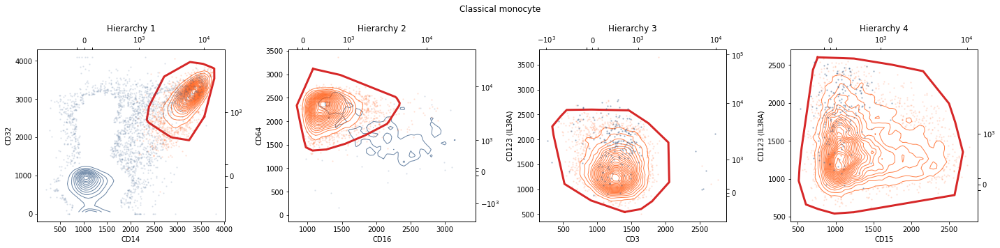

nr_targets :9799
nr_non_targets :40201
nr_targets :9664
nr_non_targets :566
nr_targets :9602
nr_non_targets :200
nr_targets :9593
nr_non_targets :182


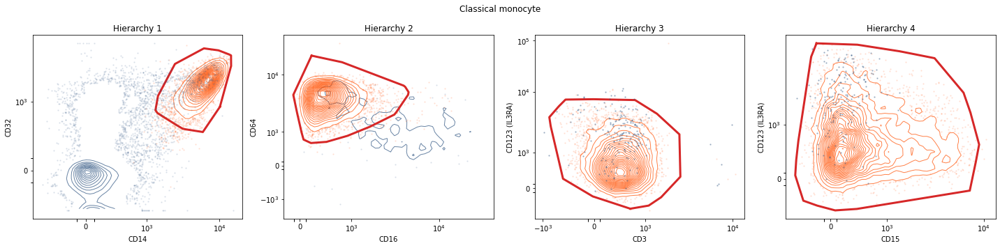

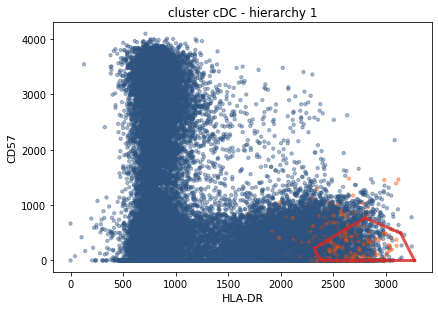

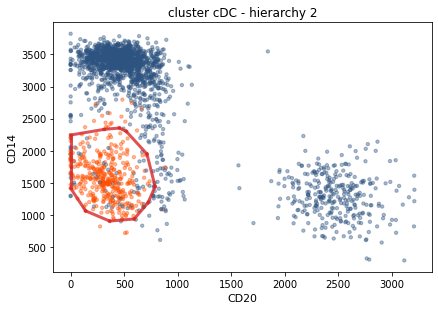

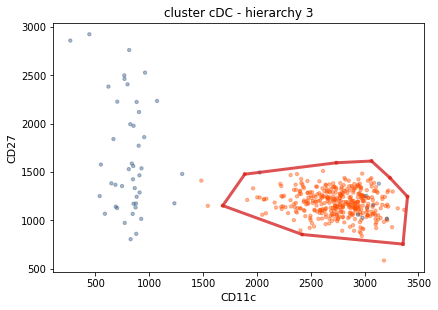

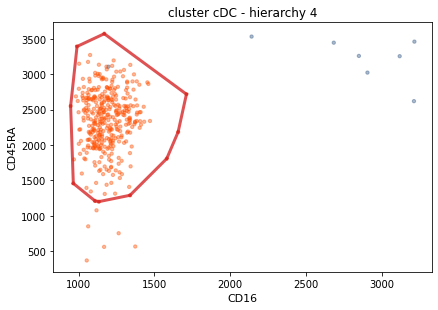

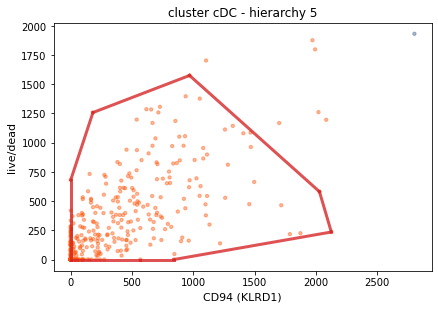

nr_targets :663
nr_non_targets :49337
nr_targets :399
nr_non_targets :1861
nr_targets :378
nr_non_targets :52
nr_targets :375
nr_non_targets :8


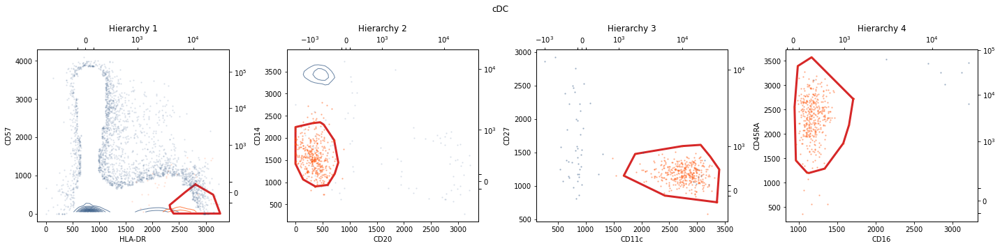

nr_targets :663
nr_non_targets :49337
nr_targets :399
nr_non_targets :1861
nr_targets :378
nr_non_targets :52
nr_targets :375
nr_non_targets :8


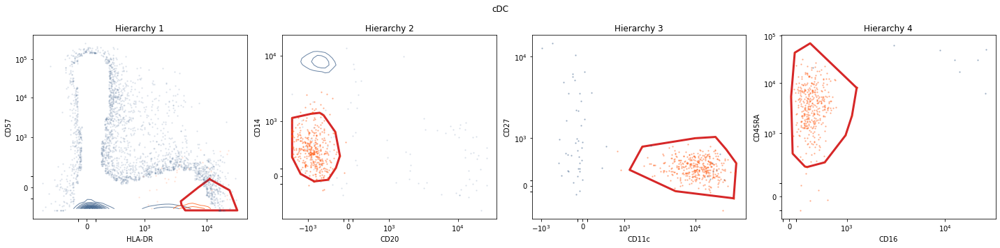

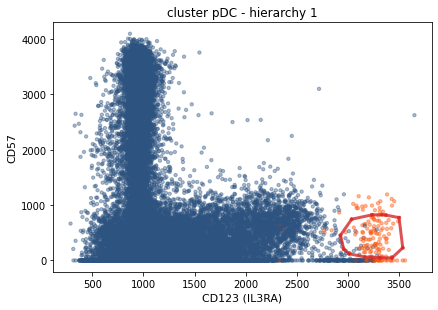

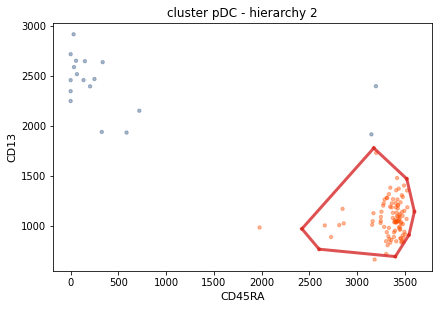

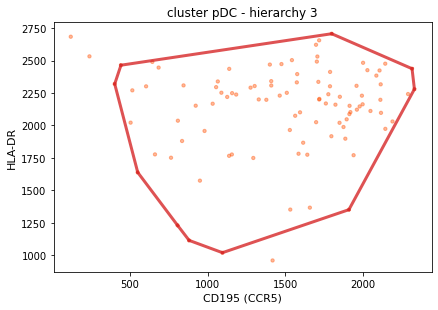

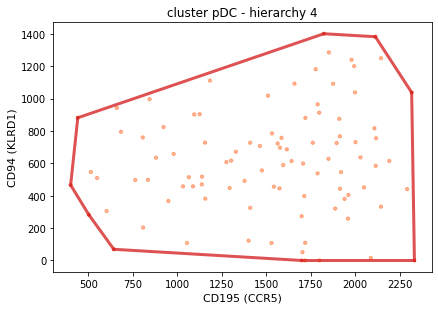

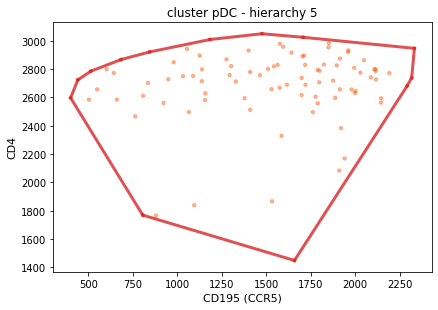

nr_targets :163
nr_non_targets :49837
nr_targets :100
nr_non_targets :18
nr_targets :98
nr_non_targets :0


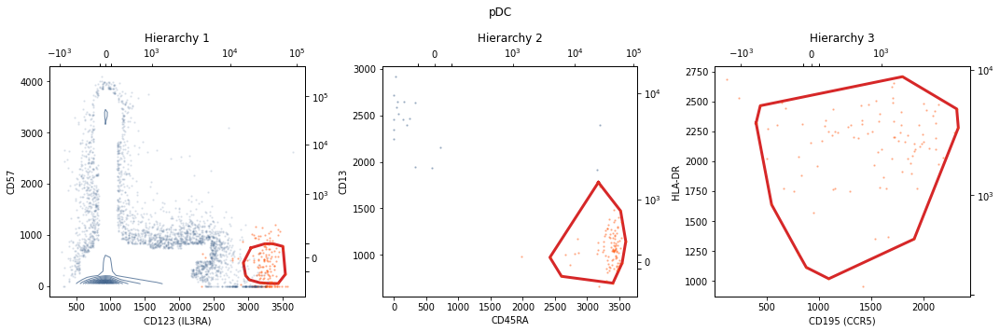

nr_targets :163
nr_non_targets :49837
nr_targets :100
nr_non_targets :18
nr_targets :98
nr_non_targets :0


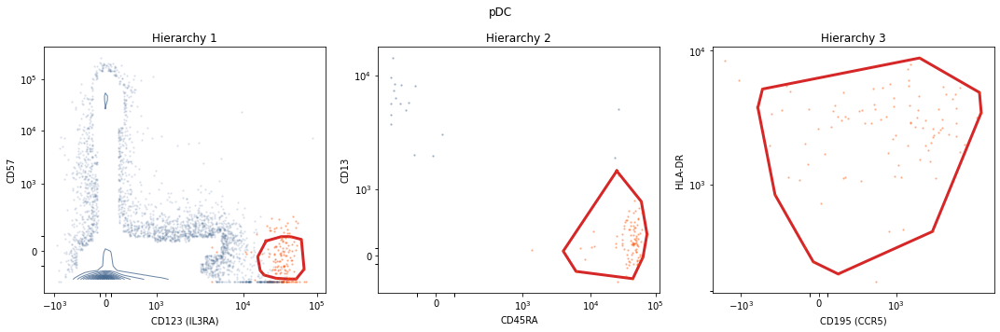

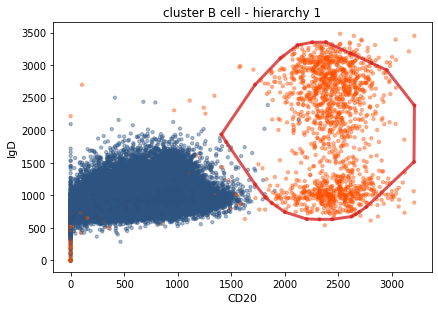

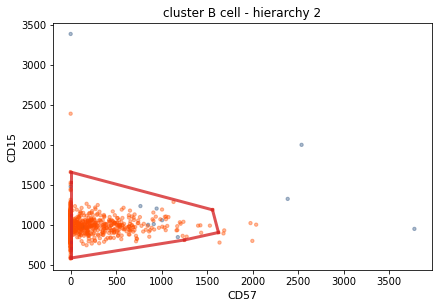

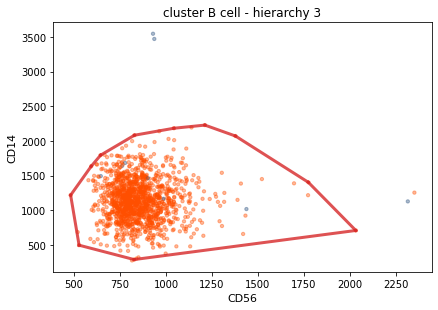

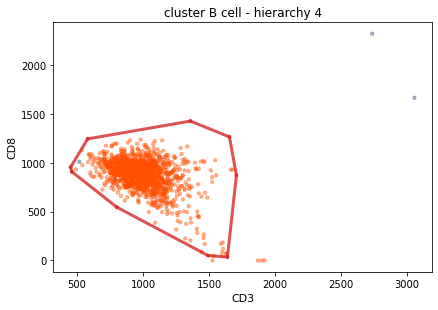

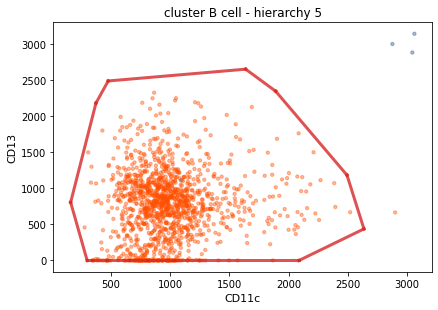

nr_targets :1672
nr_non_targets :48328
nr_targets :1358
nr_non_targets :13


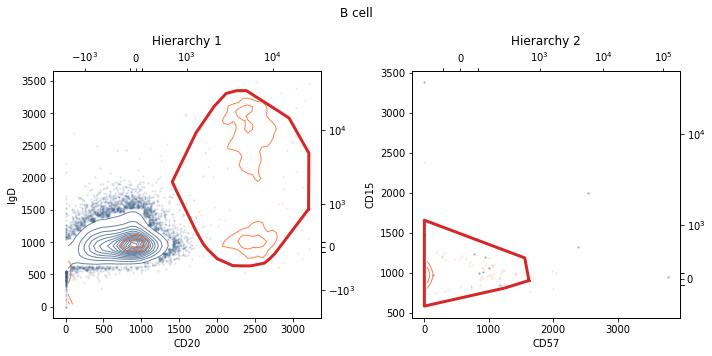

nr_targets :1672
nr_non_targets :48328
nr_targets :1358
nr_non_targets :13


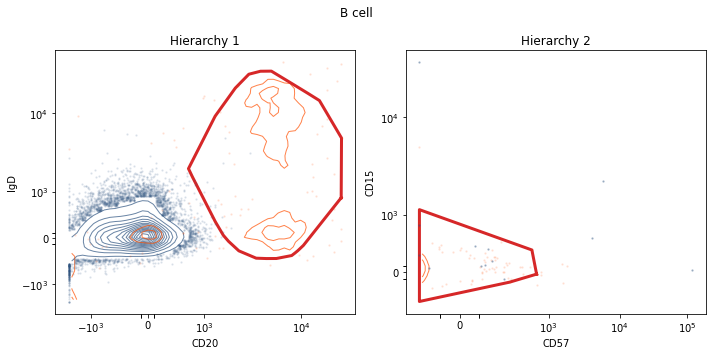

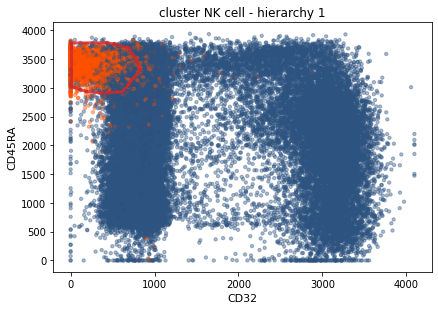

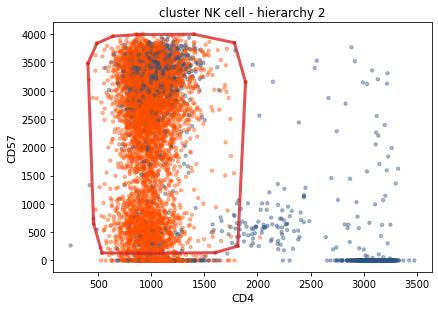

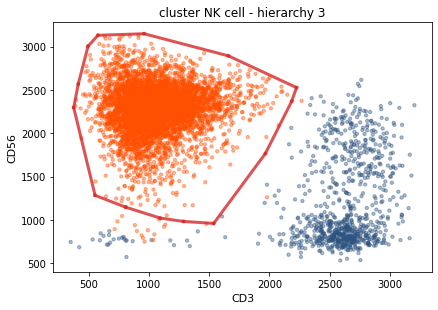

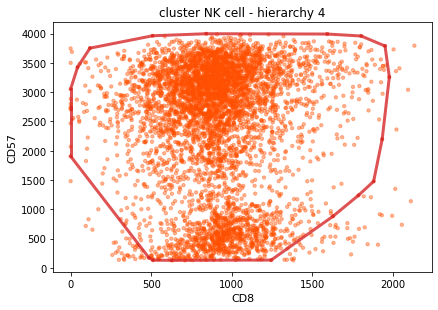

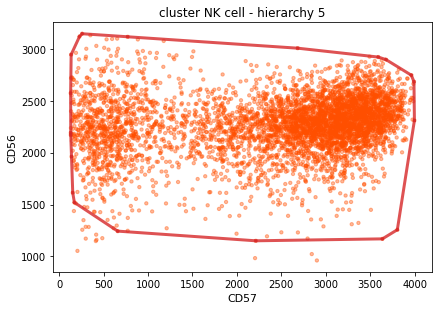

nr_targets :6467
nr_non_targets :43533
nr_targets :5474
nr_non_targets :2729
nr_targets :5046
nr_non_targets :856
nr_targets :5029
nr_non_targets :0


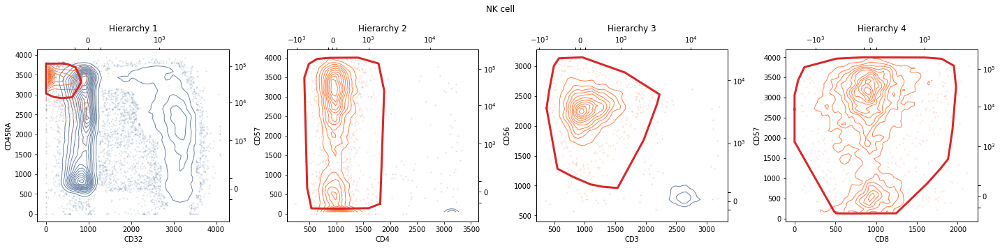

nr_targets :6467
nr_non_targets :43533
nr_targets :5474
nr_non_targets :2729
nr_targets :5046
nr_non_targets :856
nr_targets :5029
nr_non_targets :0


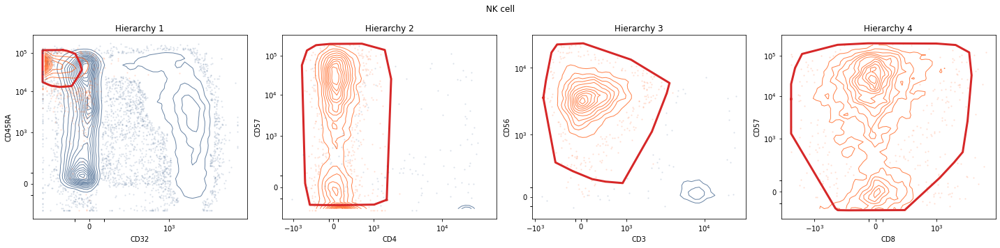

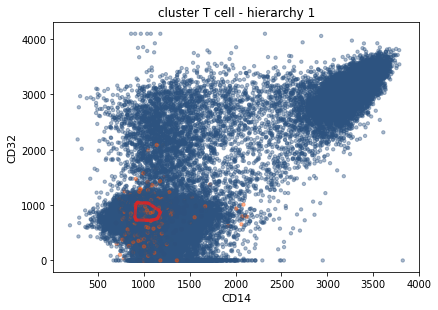

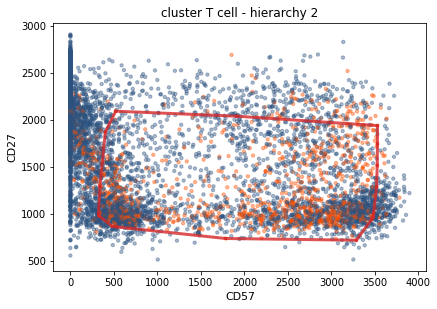

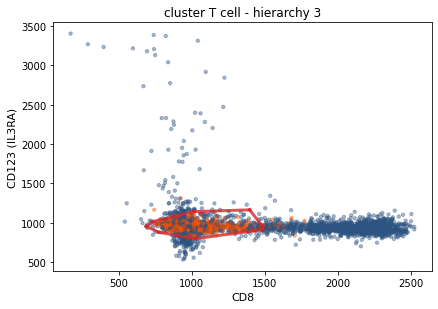

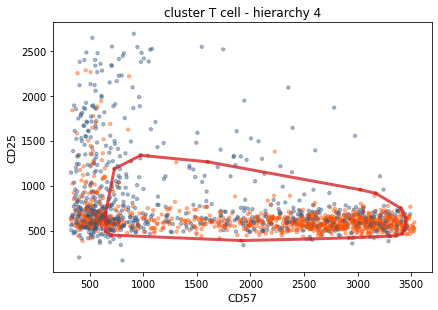

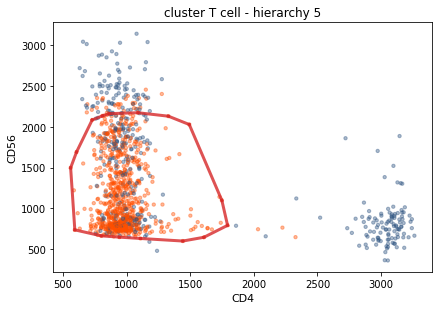

nr_targets :2416
nr_non_targets :47584
nr_targets :1236
nr_non_targets :7208
nr_targets :954
nr_non_targets :2229
nr_targets :937
nr_non_targets :724


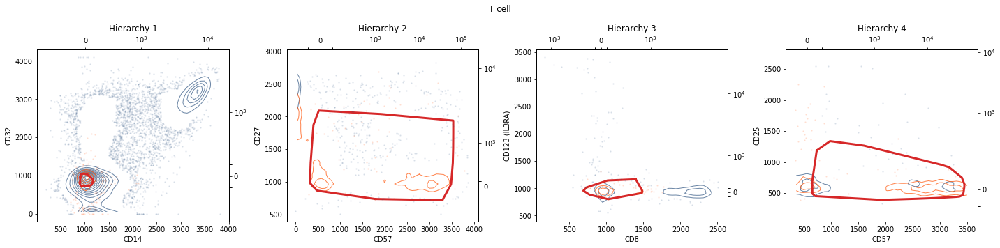

nr_targets :2416
nr_non_targets :47584
nr_targets :1236
nr_non_targets :7208
nr_targets :954
nr_non_targets :2229
nr_targets :937
nr_non_targets :724


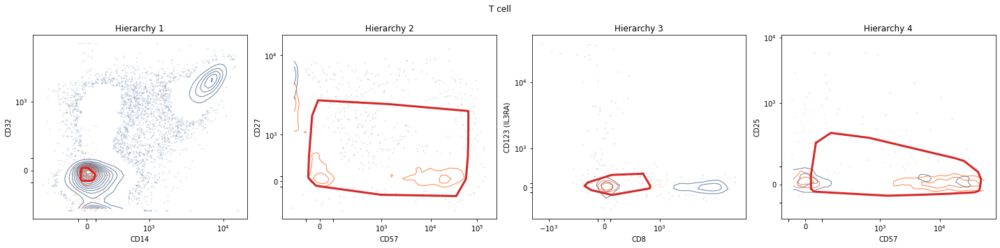

In [49]:
for cluster_key in dirIDs:
    if not cluster_key.startswith('cluster'):
        continue
    if cluster_key.count('pre-DC'):
        continue
    meta_info_path = os.path.join(add_hull_path, cluster_key, 'meta_info.npy')
    meta_info = np.load(meta_info_path,allow_pickle=True).item()

    population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)
    #read performance summary to obtain number of clusters
    per_summary = pd.read_csv(os.path.join(add_hull_path, cluster_key, 'performance_summary.csv'))
    num_hierarchies = np.min([per_summary['hierarchy'].max() + 1, 5])
    run_ID =0
    for mode in ['both', 'replace']:
        path = os.path.join(population_path, f'{cluster_key}')
        save = os.path.join(population_path, f'{cluster_key}',
                    population + f'_gating_strategy_{mode}.pdf')
        save_png = os.path.join(population_path, f'{cluster_key}', population + f'_gating_strategy_{mode}.png')
        if not os.path.exists(path):
            os.makedirs(path)
        contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                                        mode=mode, transform_func=lut_func, inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

End of the notebook.